In [1]:
# import libraries
import os
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
import numpy as np 
import math
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import layers, callbacks
from sklearn.utils import class_weight

2025-08-29 05:18:32.497886: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756444712.523268     655 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756444712.530778     655 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
train_path='new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
valid_path='new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'
test_path='new-plant-diseases-dataset/test'

In [ ]:
nums = {}
for path_name in sorted(os.listdir(train_path)):  
    class_path = os.path.join(train_path, path_name)
    if os.path.isdir(class_path):
        nums[path_name] = len(os.listdir(class_path))


n_train = sum(nums.values())
print(f"There are {n_train} images for training")

img_class = pd.DataFrame.from_dict(nums, orient='index', columns=["no. of images"])
img_class.index.name = "class name"
img_class = img_class.sort_index()

img_class

There are 70295 images for training


,no. of images
class name,
Apple___Apple_scab,2016
Apple___Black_rot,1987
Apple___Cedar_apple_rust,1760
Apple___healthy,2008
Blueberry___healthy,1816
Cherry_(including_sour)___Powdery_mildew,1683
Cherry_(including_sour)___healthy,1826
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,1642
Corn_(maize)___Common_rust_,1907


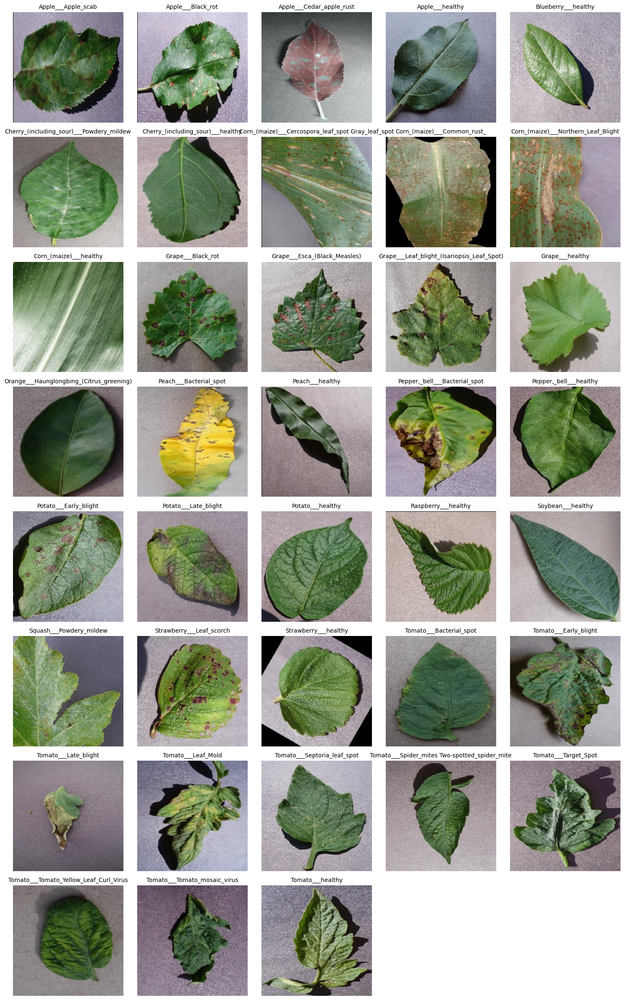

In [ ]:
import random
from PIL import Image

def show_one_image_per_class_from_folders(train_path, image_size=(224, 224)):
    class_names = sorted(os.listdir(train_path))
    cols = 5
    rows = math.ceil(len(class_names) / cols)

    plt.figure(figsize=(cols * 3, rows * 3))

    for i, class_name in enumerate(class_names):
        class_path = os.path.join(train_path, class_name)
        if not os.path.isdir(class_path):   
            continue

        image_file = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not image_file:
            continue

        chosen_image = random.choice(image_file)
        image_path = os.path.join(class_path, chosen_image)

        image = Image.open(image_path).convert("RGB").resize(image_size)

        ax = plt.subplot(rows, cols, i + 1)
        plt.imshow(image)
        plt.title(class_name, fontsize=10)
        plt.axis("off")

    for j in range(len(class_names), rows * cols):
        ax = plt.subplot(rows, cols, j + 1)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


show_one_image_per_class_from_folders(train_path)

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_path,
    validation_split=0.2,
    subset='training',
    batch_size=32,
    image_size=(224, 224), 
    seed=123,
    shuffle=True,
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    valid_path,
    validation_split=0.2,
    subset='validation',
    batch_size=32,
    image_size=(224, 224),
    seed=42,
    shuffle=True,
)

Found 70295 files belonging to 38 classes.
Using 56236 files for training.


I0000 00:00:1756444731.416511     655 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Found 17572 files belonging to 38 classes.
Using 3514 files for validation.


In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'), 
    tf.keras.layers.RandomRotation(0.2), 
    tf.keras.layers.RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)), 
    tf.keras.layers.RandomContrast(factor=0.2) 
])

In [ ]:
class_names = train_ds.class_names
num_classes = len(class_names)

print("Number of Classes:", num_classes)
print("Class Names (ordered by assigned integer label):", class_names)

print("\nCollecting all training labels for class weight calculation...")

training_labels = []
for images, labels in train_ds.unbatch():
    training_labels.append(labels.numpy())

training_labels_flat = np.array(training_labels).flatten()

unique_classes = np.arange(num_classes)
index_to_class_name = dict(zip(unique_classes, class_names))

sklearn_class_weight = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=unique_classes,
    y=training_labels_flat
)

class_weights_dict = dict(enumerate(sklearn_class_weight))

Number of Classes: 38
Class Names (ordered by assigned integer label): ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot

In [ ]:

base_model = tf.keras.applications.ResNet50(include_top=False,
                                            weights='akhil_model/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5', #Download the pre trained weights
                                            input_shape=(224, 224, 3))

base_model.trainable = False

for layer in base_model.layers[-10:]:
    layer.trainable = True

inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = tf.keras.applications.resnet.preprocess_input(x)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(num_classes)(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [ ]:
early_stopping = callbacks.EarlyStopping(patience=3)

history = model.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds,
    callbacks=[early_stopping],  
    class_weight=class_weights_dict
)

model.save_weights('/kaggle/working/resnet50_plantvillage.weights.h5')

Epoch 1/10


I0000 00:00:1756444789.277136     712 cuda_dnn.cc:529] Loaded cuDNN version 90300


1758/1758 ━━━━━━━━━━━━━━━━━━━━ 184s 95ms/step - accuracy: 0.2935 - loss: 2.8119 - val_accuracy: 0.8640 - val_loss: 0.4680
Epoch 2/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 162s 92ms/step - accuracy: 0.8342 - loss: 0.5980 - val_accuracy: 0.9217 - val_loss: 0.2463
Epoch 3/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 162s 92ms/step - accuracy: 0.9075 - loss: 0.3203 - val_accuracy: 0.9493 - val_loss: 0.1708
Epoch 4/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 162s 92ms/step - accuracy: 0.9346 - loss: 0.2216 - val_accuracy: 0.9548 - val_loss: 0.1419
Epoch 5/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 162s 92ms/step - accuracy: 0.9508 - loss: 0.1657 - val_accuracy: 0.9613 - val_loss: 0.1202
Epoch 6/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 162s 92ms/step - accuracy: 0.9601 - loss: 0.1329 - val_accuracy: 0.9701 - val_loss: 0.0949
Epoch 7/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 162s 92ms/step - accuracy: 0.9655 - loss: 0.1122 - val_accuracy: 0.9755 - val_loss: 0.0847
Epoch 8/10
1758/1758 ━━━━━━━━━━━━━━━━━━━━ 162s 92ms/step - accuracy: 0.9688 - lo

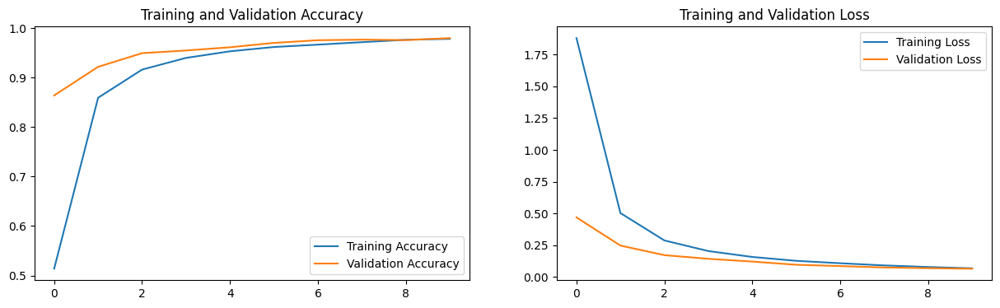

In [10]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))

plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

📊 Validation Evaluation Metrics:
Accuracy : 0.9798
Precision: 0.9803
Recall   : 0.9798
F1-score : 0.9798

🧾 Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.97      0.98        91
                                 Apple___Black_rot       1.00      0.98      0.99       109
                          Apple___Cedar_apple_rust       1.00      0.98      0.99        85
                                   Apple___healthy       0.94      1.00      0.97       101
                               Blueberry___healthy       1.00      1.00      1.00        87
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00        77
                 Cherry_(including_sour)___healthy       1.00      0.99      0.99        77
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.92      0.95        77
                       Corn_(maize)___Co

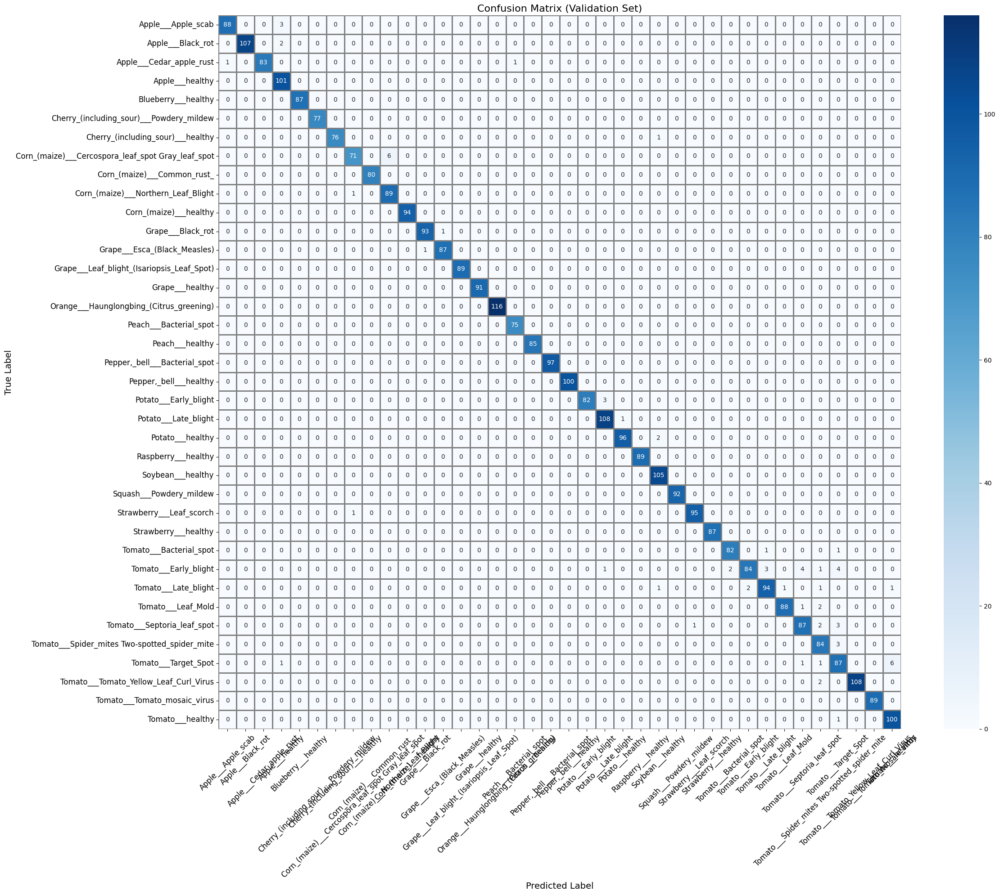

In [11]:

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)

y_true = []
y_pred = []

for images, labels in val_ds:
    predictions = model.predict(images, verbose=0)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
cm = confusion_matrix(y_true, y_pred)

print("📊 Validation Evaluation Metrics:")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-score : {f1:.4f}")
print()

print("🧾 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))

plt.figure(figsize=(24, 20)) 
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names,
            linewidths=1, linecolor='gray')
plt.title('Confusion Matrix (Validation Set)', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━

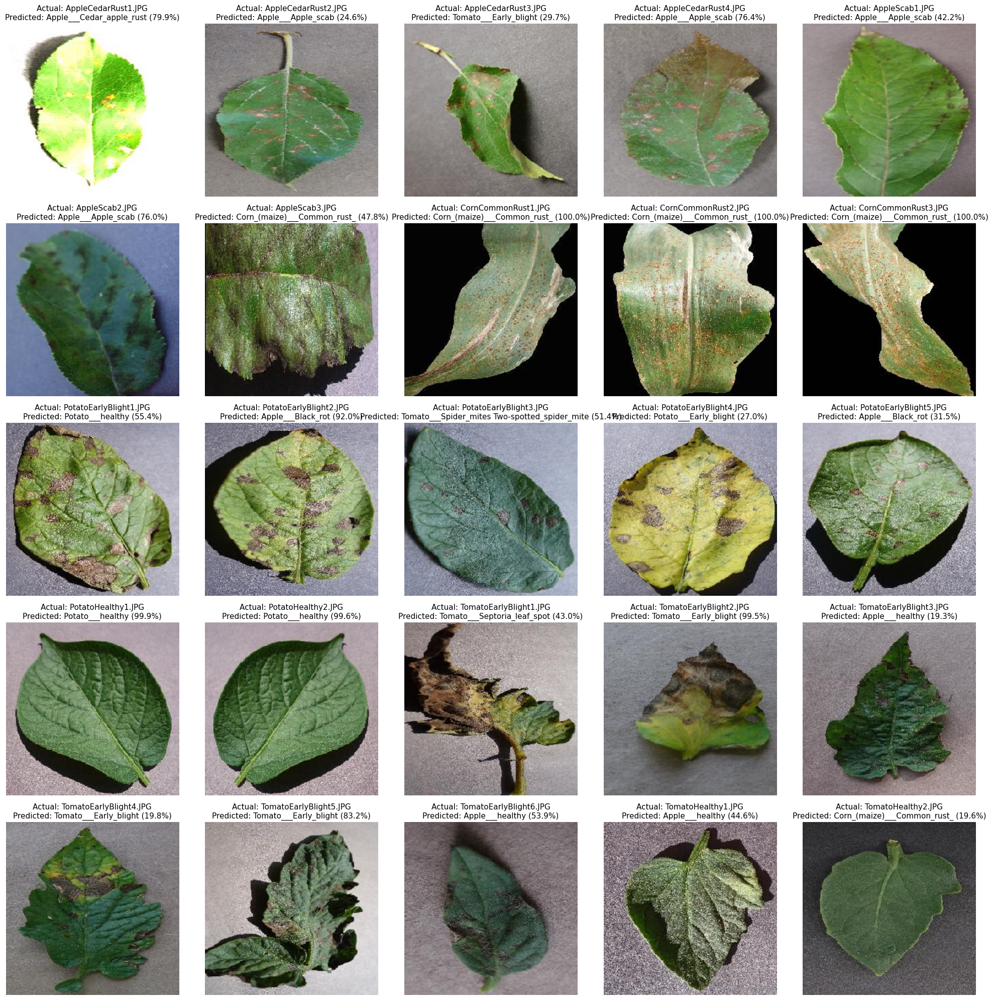

In [ ]:
def load_and_preprocess_image(img_path):
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.resnet.preprocess_input(img_array)
    return img_array

results = []
for filename in sorted(os.listdir(test_path + "/test")):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(test_path + "/test", filename)
        img_array = load_and_preprocess_image(img_path)

        # Predict
        logits = model.predict(img_array)
        probs = tf.nn.softmax(logits, axis=-1).numpy()
        predicted_index = tf.argmax(probs, axis=-1).numpy()[0]
        confidence = probs[0][predicted_index]
        predicted_label = index_to_class_name[predicted_index]

        results.append({
            "filename": filename,
            "img_path": img_path,
            "label": predicted_label,
            "confidence": confidence
        })

plt.figure(figsize=(20, 20))
for i, result in enumerate(results[:25]):
    plt.subplot(5, 5, i + 1)
    img = tf.keras.utils.load_img(result["img_path"], target_size=(224, 224))
    plt.imshow(img)
    plt.title(f"Actual: {result['filename']}\nPredicted: {result['label']} ({result['confidence'] * 100:.1f}%)", fontsize=11)
    plt.axis("off")
plt.tight_layout()
plt.show()